# GLASGOW UNIVERSITY EVENT SYSTEM TALK MODEL DESIGN

#This notebook presents the topic model for the Glasgow University Event Website. The topic model is designed based on the talk attributes like title, abstract and speaker affiliation. The key design principles used to implement this design are tfidf, LCA and t-SNE. For description of these principle see the project documentation.

What this program does:

    1. TFIDF t-SNE talk visualisation
    2. Word2Vec visualisation of word in all talks
    3. LDA modelling of topics for topic searching
    4. LDA modelling of topics for topic visualisation.

# Click the double arrowed button above and enter the academic year you want to visualise:

In [1]:
#It has to be a number NOT alphabetic
#It has to be equal to greater than 2012
#It has to be equal or less than the current year
#A valid pass returns the academic year , Not valid entry returns 0

#MAKE SURE YOU HAVE THE CORRECT DATABASE CONNECTION DETAILS!!!
#MAKE SURE YOUR NOTEBOOK HAS ALL THE REQUIRED MODULES INSTALLED!!!

In [2]:
#Import date library
import datetime
from datetime import datetime, timedelta
import numpy as np
# LDA, tSNE
from sklearn.manifold import TSNE
from gensim.models.ldamodel import LdaModel
# NLTK
from nltk.tokenize import RegexpTokenizer
from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import stopwords
import re
# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib
%matplotlib inline
import seaborn as sns
# Bokeh
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, CustomJS, ColumnDataSource, Slider
from bokeh.layouts import column
from bokeh.palettes import all_palettes, Viridis256 
output_notebook()

C:\Users\User\Anaconda\lib\site-packages\gensim\utils.py:1209: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


Loading BokehJS ...

In [3]:
#Method to get the current year 
def this_year():
    year = datetime.now()
    year = year.year
    return year

#Method to validate the academic year number entered 
def year_entered():
    process = True
    while process:
        try:
            ACADEMIC_YEAR = int(input("Please enter the academic year you wish to visualise, between 2012 and this year: "))
            if ACADEMIC_YEAR >= 2012 and ACADEMIC_YEAR <= this_year():
                process = False
                print("correct")
                return ACADEMIC_YEAR
            if len(str(ACADEMIC_YEAR)) != 4:
                print("!!Ensure your academic year is a four digit number")
            if ACADEMIC_YEAR is None:
                print("!!Please enter an academic year")
            else:
                print("!!Enter a valid input")
        except:
            print ("!!Invalid input data, please enter the right data")

#Enter year now
year_entered = year_entered()


Please enter the academic year you wish to visualise, between 2012 and this year: 2016
correct


# Carry out test showing that only correct input year are accepted¶


In [4]:
#Unit test model
%load_ext ipython_unittest

In [5]:
%%unittest_main
class MyTest(unittest.TestCase):
    def test_range(self):
        range_year = year_entered >= 2012 and year_entered <= this_year()
        self.assertEqual(range_year, True)
    def test_digits(self):
        digit_check = len(str(year_entered)) == 4
        self.assertEqual(digit_check, True)
    def test_empty(self):
        test_empty = year_entered is None
        self.assertEqual(test_empty, False)


Success

...
----------------------------------------------------------------------
Ran 3 tests in 0.001s

OK


<unittest.runner.TextTestResult run=3 errors=0 failures=0>

In [6]:
#Import libaries required to perform analysis

import pandas as pd
from pandas import Series,DataFrame
import numpy as np

# For visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

from __future__ import division

In [7]:
#Import the following required libraries for the natural landuage processing
import string
import os
import time
import _pickle as cPickle
import json
import wikipedia
import nltk
import numpy as np
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.manifold import TSNE
from sklearn.preprocessing import normalize
from sklearn.decomposition import TruncatedSVD

In [8]:
#We want to load the SQL data for talk, organisational group and location from MYSQL database
import MySQLdb

try:
    mysql_cn= MySQLdb.connect(host='127.0.0.1', port=33060,
                    user='readonlytalks', passwd='KAXV5wwC', 
                    db='talksdb_copy')

    talk_details = pd.read_sql("SELECT T.id, T.title,T.description, T.starttime, T.speakerAffiliation,T.owningOu,ou.name,ou.shortname FROM organisationalUnits AS ou INNER JOIN  talks  AS T ON T.owningOU = ou.id  INNER JOIN locations AS L ON T.location = L.id where T.starttime >="  +  "'" +str(year_entered)+ ".09.01'" + "AND" + " T.starttime <="  +  "'" +str(year_entered+1)+ ".09.01';" , con=mysql_cn)   
except: 
    traceback.print_exc()
    
#Now let's open the talk_details in a dataFrame
#First save as a csv to avoid the duplicate axis issues
#Also ensures quick accessibility and availability of data
dframe = DataFrame(talk_details)
dframe.to_csv('talk_Model'+str(year_entered)+'.csv')
talk_Model=pd.read_csv('talk_Model'+str(year_entered)+'.csv')

if talk_Model.empty:
    print("DataFrame is empty")
else:
    #Process the dataframe
    talk_Model = talk_Model.sort_values('starttime',ascending=True)
    talk_Model = talk_Model[talk_Model['title'] != "TBC"]
    talk_Model = talk_Model[talk_Model['title'] != "TBA"]
    talk_Model = talk_Model[talk_Model['title'] !="Get Your Feet Wet With SDN in a HARMLE$$ Way"]
    #Drop the unknow column
    talk_Model = talk_Model.drop(['Unnamed: 0'], axis=1)
    
#Display dataframe
talk_Model.head()

,id,title,description,starttime,speakerAffiliation,owningOu,name,shortname
2,522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education
481,8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars
1,492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars
3,527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education
480,8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg


In [9]:
#Import date library

import datetime
from datetime import datetime, timedelta

#Let's add the day value to the dataframe so we can order by days
#method to return actual date values
def days_Value (dateandtime):

    #dateandtime = talk_details['starttime']
    theday = dateandtime.str.split('-')
    year = int(theday[0][0])
    month = int(theday[0][1])
    day = int(theday[0][2][0:2])
    hour = int(theday[0][2][3:5])
    mins = int(theday[0][2][6:8])
    seconds = int(theday[0][2][9:11])

    #insert the dates into the datetime method
    a1 = datetime(year,month,day,hour,mins,seconds)

    a2 = datetime.now() - a1

    days = a2.days
    
    return days 


In [10]:
#Add new column - day_value
talk_Model['day_value'] = talk_Model[['starttime']].apply(days_Value,axis=1)

talk_Model.head()

,id,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value
2,522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education,724
481,8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars,720
1,492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars,719
3,527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education,717
480,8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg,714


In [11]:
#Methods to clean up the talks as shown below

import re
#Remove all tags
def cleanhtml(text):
        cleanr = re.compile('<.*?>')
        cleantext = re.sub(cleanr, '', str(text))
        return cleantext
    
#Remove all and sysmbols
def cleanhtml1(text):
    cleantext=str(text)
    cleantext = text.replace('&amp;', ' ')
    cleantext = text.replace('&nbsp;', ' ')
    return cleantext

#Reomve all website links
def cleanURLs(text):
    cleantext=str(text)
    text = re.sub(r'^https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    return text

#Process the text
def processText(text):
    for i, description in enumerate(text):
        clean_text = cleanhtml(description)
        clean_text = cleanhtml1(clean_text)
        clean_text = cleanURLs(clean_text)
        return str(clean_text)


#Add new column - clean description 
talk_Model['clean_description'] = talk_Model[['description']].apply(processText,axis=1)

talk_Model.head()

,id,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description
2,522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education,724,\r\r\nWe have used broadly the same assessment...
481,8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars,720,While patients with right parietal damage negl...
1,492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars,719,"In recent years, software testing research has..."
3,527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education,717,How do we teach Computer Science to our univer...
480,8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg,714,Please all come.\r\n\r\nFirst meeting after su...


In [12]:
#Now let make the talk_model id column the index

talk_Model['refID'] = talk_Model['id']

talk_Model.set_index('id', inplace=True)

talk_Model.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID
id,,,,,,,,,,
522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education,724,\r\r\nWe have used broadly the same assessment...,522
8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars,720,While patients with right parietal damage negl...,8111
492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars,719,"In recent years, software testing research has...",492
527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education,717,How do we teach Computer Science to our univer...,527
8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg,714,Please all come.\r\n\r\nFirst meeting after su...,8110


In [13]:
#Now let's set up a  token dictionary
token_dict = {}


#Scan through title and count them and store their content in variable article
for i, talkID in enumerate(talk_Model['refID']):
        #Check is the title is already in the dictionary
        if talkID  not in token_dict: 
            try:
                #The contents of the article and store them in the 
                token_dict[talkID ] = talk_Model.loc[talkID]['clean_description']
            except:
                #Print message if there is a processing isssue
                print (" ==> error processing "+talkID)

#print(token_dict)

In [14]:
#Save the titles in a dictionary
#To retrieve later
cPickle.dump(token_dict, open("talk_Model.p", "wb" ))

In [15]:
#Now time for some natural language processing
import nltk
nltk.download('punkt')

#define a function which converts raw text into vector and tokens
def tokenize(text):
    #Make all text lower case
    text = text.lower() # lower case
    ## remove punctuation and line breaks/tabs
    for e in set(string.punctuation+'\n'+'\t'):
        #Remove all space
        text = text.replace(e, ' ')
    # remove double spaces
    for i in range(0,10):
        text = text.replace('  ', ' ')
     # remove punctuation
    text = text.translate(string.punctuation)
    #Make the text tokens
    tokens = nltk.word_tokenize(text)
    #Using list comprehension get only words not in stop words
    text = [w for w in tokens if not w in stopwords.words('english')] # stopwords
    #Define a list
    stems = []
    #Stems the words For example running to run
    #Then return the stem
    for item in tokens: # stem
        stems.append(PorterStemmer().stem(item))
    return stems

#Get the dictionary values
dict_values = token_dict.values()

# Let's write a function that will calculate tfidf (might take a while)
def vectorise_transform(dict):
    print ("calculating tf-idf")
    #The tokinize method returns the stems words
    #The tfidf vectoriser function receives the stem words as parameter
    #And also the stop-words
    tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
    print(tfidf)
    #Perform perform a dimensionality reduction with SVD
    #tfs = TruncatedSVD(n_components=1000, random_state=0).fit_transform(tfs)
    #Get the tfidf
    tfs = tfidf.fit_transform(dict)
    print(tfs)
    #Reduce to 1000 dimnesions
    print ("reducing tf-idf to 1000 dim")
    tfs_reduced = TruncatedSVD(n_components=1000, random_state=0).fit_transform(tfs)
    print(tfs_reduced)
    return tfs_reduced 

#Number preform the vectorisation and transformation
vectorise_transform(dict_values)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
calculating tf-idf
TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,
        stop_words='english', strip_accents=None, sublinear_tf=False,
        token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=<function tokenize at 0x0000016DE3A8DD08>, use_idf=True,
        vocabulary=None)
  (0, 1)	0.3184571741078255
  (0, 7041)	0.04355706676347426
  (0, 1098)	0.13628800669749064
  (0, 704)	0.09494959368510057
  (0, 2530)	0.19996629812926217
  (0, 5230)	0.08735962916794299
  (0, 5908)	0.07635827562913458
  (0, 1794)	0.10501670444416165
  (0, 1893)	0.07305127122846836
  (0, 4115)	0.1156188001912956
  (0, 1361)	0.1698372

array([[-1.29642825e-15,  2.08647703e-01, -2.44977426e-02, ...,
         0.00000000e+00, -0.00000000e+00,  5.66162606e-33],
       [ 1.34965861e-16,  9.47884770e-02, -3.59840883e-02, ...,
         8.23903603e-33, -1.00563114e-32,  2.97147829e-34],
       [-3.26106077e-15,  2.97157730e-01, -3.98053877e-02, ...,
         3.41182082e-33, -4.05193863e-33,  4.10437598e-34],
       ...,
       [-8.53871877e-16,  1.35117089e-01, -3.74490143e-02, ...,
         3.50249240e-33,  1.08520128e-32,  1.52037206e-35],
       [-1.64600513e-15,  2.57248322e-01,  3.75331783e-02, ...,
         3.13504342e-33,  3.71821111e-33, -7.35955099e-34],
       [-0.00000000e+00, -0.00000000e+00, -0.00000000e+00, ...,
         0.00000000e+00, -0.00000000e+00,  0.00000000e+00]])

In [16]:
#See contents of the dictionary
#dict_values
#token_dict

In [17]:
#Display the size of the tfidf
tfs_transform=vectorise_transform(dict_values)
print ("size of TSVD: "+str(tfs_transform.shape))
#P

tfs_transform

calculating tf-idf
TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,
        stop_words='english', strip_accents=None, sublinear_tf=False,
        token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=<function tokenize at 0x0000016DE3A8DD08>, use_idf=True,
        vocabulary=None)
  (0, 1)	0.3184571741078255
  (0, 7041)	0.04355706676347426
  (0, 1098)	0.13628800669749064
  (0, 704)	0.09494959368510057
  (0, 2530)	0.19996629812926217
  (0, 5230)	0.08735962916794299
  (0, 5908)	0.07635827562913458
  (0, 1794)	0.10501670444416165
  (0, 1893)	0.07305127122846836
  (0, 4115)	0.1156188001912956
  (0, 1361)	0.16983720758518214
  (0, 6127)	0.09998314906463109
  (0, 146)	0.10114019633925632
  (0, 209)	0.0940648733760483
  (0, 3734)	0.15192365782415515
  (0, 3735)	0.1

array([[-1.29642825e-15,  2.08647703e-01, -2.44977426e-02, ...,
         0.00000000e+00, -0.00000000e+00,  5.66162606e-33],
       [ 1.34965861e-16,  9.47884770e-02, -3.59840883e-02, ...,
         8.23903603e-33, -1.00563114e-32,  2.97147829e-34],
       [-3.26106077e-15,  2.97157730e-01, -3.98053877e-02, ...,
         3.41182082e-33, -4.05193863e-33,  4.10437598e-34],
       ...,
       [-8.53871877e-16,  1.35117089e-01, -3.74490143e-02, ...,
         3.50249240e-33,  1.08520128e-32,  1.52037206e-35],
       [-1.64600513e-15,  2.57248322e-01,  3.75331783e-02, ...,
         3.13504342e-33,  3.71821111e-33, -7.35955099e-34],
       [-0.00000000e+00, -0.00000000e+00, -0.00000000e+00, ...,
         0.00000000e+00, -0.00000000e+00,  0.00000000e+00]])

# [1.1] TALK MODEL USING TFIDF and T-SNE for this academic year (Initial)

In [18]:
#Let's now implement t-SNE
#model = TSNE(n_components=2, perplexity=50, verbose=2).fit_transform(tfs.todense())
print(__doc__)
#Import all required libraries
from time import time
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
from sklearn import manifold, datasets

#Now write a method to plot the tSNE plot
#Set the start time
t0 = time()
#Perform tsne with the reduced tfidf
model = TSNE(n_components=2, perplexity=1, verbose=5).fit_transform(tfs_transform)

#set stop time
t1 = time()


Automatically created module for IPython interactive environment
[t-SNE] Computing 4 nearest neighbors...
[t-SNE] Indexed 618 samples in 0.015s...
[t-SNE] Computed neighbors for 618 samples in 0.656s...
[t-SNE] Computed conditional probabilities for sample 618 / 618
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 188.3186951, gradient norm = 0.1841409 (50 iterations in 0.733s)
[t-SNE] Iteration 100: error = 160.7621460, gradient norm = 0.1600730 (50 iterations in 0.720s)
[t-SNE] Iteration 150: error = 124.7705460, gradient norm = 0.6239400 (50 iterations in 0.484s)
[t-SNE] Iteration 200: error = 174.0124207, gradient norm = 0.1380475 (50 iterations in 0.511s)
[t-SNE] Iteration 250: error = 131.9633331, gradient norm = 0.3119376 (50 iterations in 0.566s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 131.963333
[t-SNE] Iteration 300: error = 5.2795753, gradient norm = 0.0125487 (50 iterations in 0.447s)

In [19]:
#Build the tSNE dataframe for the visualisation
tfModel = pd.DataFrame(model, columns=('x','y'))

tfModel['hue'] = talk_Model['shortname'].values

tfModel['hue1'] = talk_Model['title'].values

factor = pd.factorize(talk_Model['shortname'])

values_factor= pd.Series(factor[0][0:])

values_factor = DataFrame(values_factor)

tfModel['hue_factor'] = values_factor.values

tfModel['time'] = talk_Model['starttime'].values

tfModel['ref'] = talk_Model['refID'].values

tfModel.head()

,x,y,hue,hue1,hue_factor,time,ref
0,15.050236,-17.623896,CS-Education,Making our lives manageable!! Workshop to Reco...,0,2016-09-02 08:30:00,522
1,15.376544,-10.094393,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1,2016-09-06 14:30:00,8111
2,7.936404,-9.927804,socs-systems-seminars,Systems Seminar: Sorting Sheep from Goats - Au...,2,2016-09-07 12:00:00,492
3,6.085509,-12.466474,CS-Education,Technology Enhanced Learning for Computer Science,0,2016-09-09 11:30:00,527
4,7.133041,-15.278890,sopsy-megrg,Getting in gear with MEG,3,2016-09-12 10:00:00,8110


In [20]:
#Built an array of colours for each series in the visualisation
from random import randint
colors = []

for i in range(len(tfModel)):
    colors.append('%06X' % randint(0, 0xFFFFFF))

colors[0:4]

d = {'colour': [colors][0]}
colors = pd.DataFrame(data=d)
colors.head()

#Make the t-SNE table to array in ascending order of the hue factorisation
#This is to properly allocate colours to different organisational group
tfModel = tfModel.sort_values('hue_factor',ascending=True)
tfModel.head()

,x,y,hue,hue1,hue_factor,time,ref
0,15.050236,-17.623896,CS-Education,Making our lives manageable!! Workshop to Reco...,0,2016-09-02 08:30:00,522
3,6.085509,-12.466474,CS-Education,Technology Enhanced Learning for Computer Science,0,2016-09-09 11:30:00,527
384,6.215806,-9.114918,CS-Education,CS for all - a new 3-15 CS curriculum for Scot...,0,2017-03-06 13:00:00,2679
1,15.376544,-10.094393,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1,2016-09-06 14:30:00,8111
202,-0.522827,-14.411412,sopsy-seminars,Social motivations in choice: insights from de...,1,2016-12-02 15:30:00,8133


In [21]:
#Add the colours to the array
i=0
data = []
for hue1 in tfModel['hue_factor'][0:len(tfModel)]:
    if hue1 == i:
        data.append("#"+colors.loc[i]['colour'])
        #print(hue1,colors.loc[i]['colour'])
        
    else:
        i=i+1
        data.append("#"+colors.loc[i]['colour'])
        #print(hue1,colors.loc[i]['colour']) 
        
        


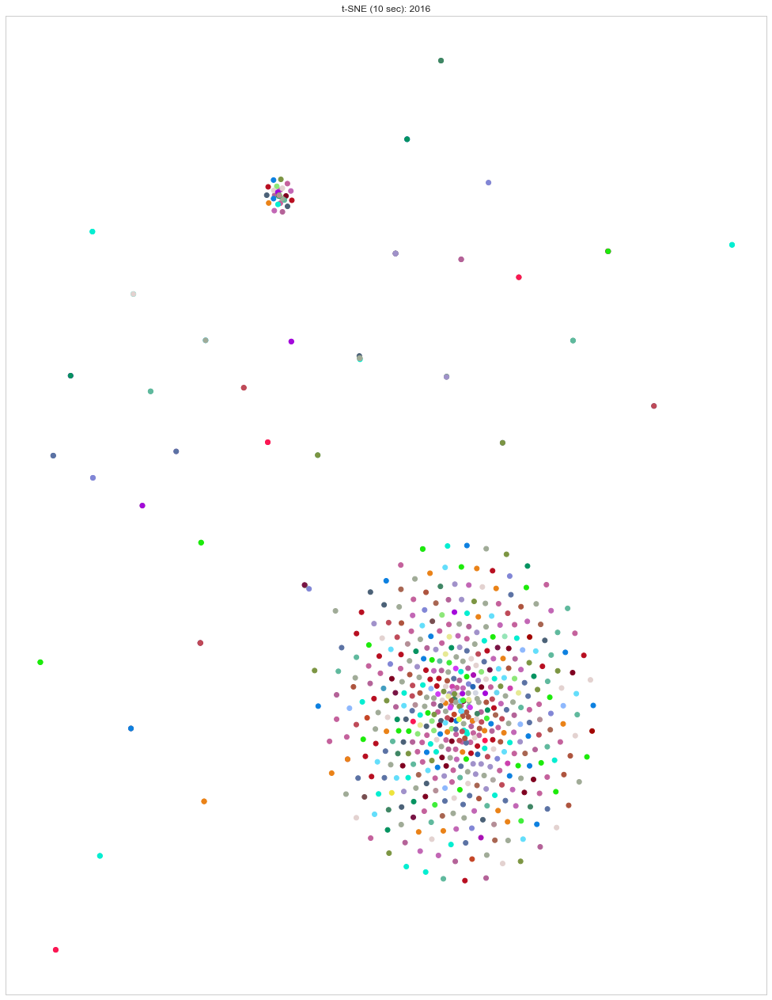

In [22]:
#Now plot the TSNE model
def plotTSNE():
    df = pd.DataFrame( index = tfModel['hue'],columns=['x', 'y'])
    df['x'] = tfModel['x'].values
    df['y'] = tfModel['y'].values
    
    #Define points
    n_points = len(talk_Model)
    #Generates points and colour
   # X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)

    #Plot the figures of the tsne model
    fig = plt.figure(figsize=(100,50))
    ax = fig.add_subplot(2, 5, 10)
    plt.scatter(model[:, 0], model[:, 1], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.grid(False)
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    return plt.show()

plotTSNE()

# [1.2] TALK MODEL USING TFIDF and T-SNE showing titles 

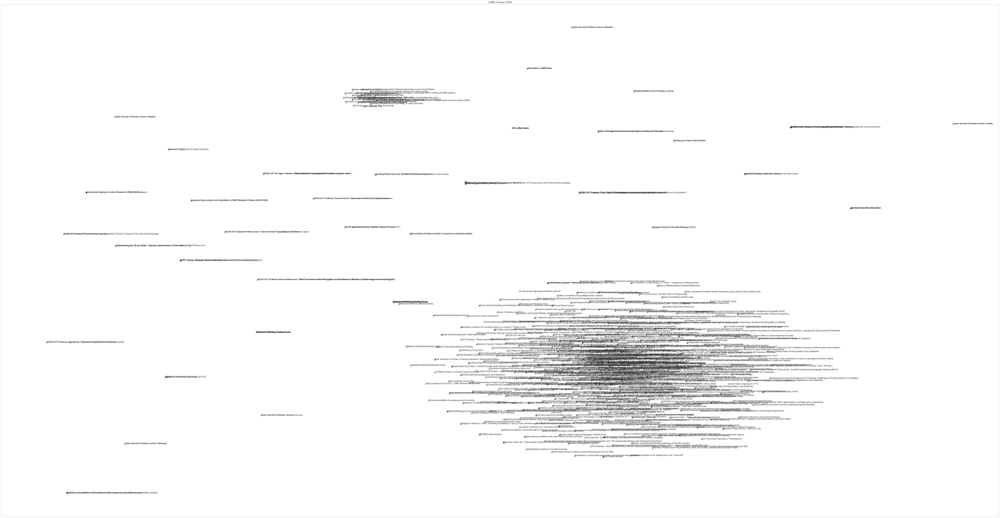

In [23]:
#Plot t-SNE with the labels

def plotwithLabel():
    df = pd.DataFrame( index = tfModel['hue1'],columns=['x', 'y'])
    df['x'] = tfModel['x'].values
    df['y'] = tfModel['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    
    #Save to model to JSON file
    tfModel.to_json('tfidf-tSNE'+str(year_entered)+'.json')
    return plt.show()

plotwithLabel()

# [1.3] TALK MODEL USING TFIDF and T-SNE showing series short name for this academic year


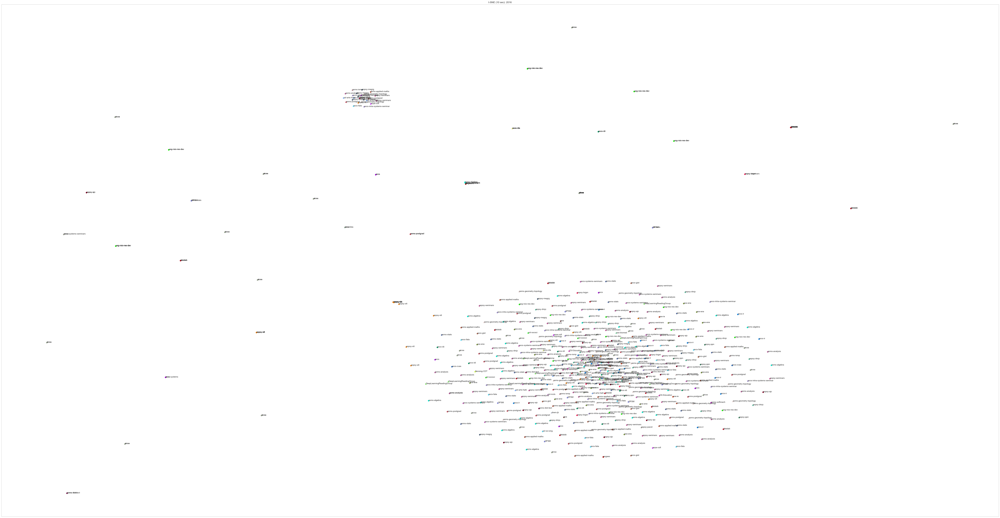

In [24]:
#Plot t-SNE with the labels (shortnames)

def plotwithLabel1():
    df = pd.DataFrame( index = tfModel['hue'],columns=['x', 'y'])
    df['x'] = tfModel['x'].values
    df['y'] = tfModel['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    return plt.show()

plotwithLabel1()

In [25]:
#Now plot the tSNE interactive model
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show

source = ColumnDataSource(data=dict(
    x = tfModel.x,
            y = tfModel.y,
            colors = data,
            title = tfModel['hue1'],
            series = tfModel['hue'],
            time = tfModel['time'],
            link = tfModel['ref'],
            alpha = [0.9] * model.shape[0],
            size = [7] * model.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']

plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')


plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")



plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False
url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# [1.6] Modified TALK MODEL USING TFIDF and T-SNE and HASH injection (The Prince's Model)  

In [26]:
#Let's view the talk dataframe for the hash injection
talk_Model2= talk_Model

talk_Model2.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID
id,,,,,,,,,,
522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education,724,\r\r\nWe have used broadly the same assessment...,522
8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars,720,While patients with right parietal damage negl...,8111
492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars,719,"In recent years, software testing research has...",492
527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education,717,How do we teach Computer Science to our univer...,527
8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg,714,Please all come.\r\n\r\nFirst meeting after su...,8110


In [27]:
#Let's write a method to inject some "series hash-string" into the abstract 
#This is to optimise the accuracy of the talk model by keeping similar talk together while also retaining the orginating series 
#characteristics

#Mehtod for inserting hash-string
def seriesHash(hashString):
    hashedAbstract = hashString.str.replace(' ',"")
    return hashedAbstract

talk_Model2['hashedDescription'] = talk_Model2[['name']].apply(seriesHash,axis=1)

talk_Model2.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription
id,,,,,,,,,,,
522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education,724,\r\r\nWe have used broadly the same assessment...,522,ComputingScienceEducationResearchandPractice
8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars,720,While patients with right parietal damage negl...,8111,SeminarSeries
492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars,719,"In recent years, software testing research has...",492,SystemsSeminars
527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education,717,How do we teach Computer Science to our univer...,527,ComputingScienceEducationResearchandPractice
8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg,714,Please all come.\r\n\r\nFirst meeting after su...,8110,MEGReadingGroup


In [28]:
#Aadd the hashed string into the dataframe

talk_Model2['Description1'] = talk_Model2['clean_description'] +" "+ talk_Model2['hashedDescription']

talk_Model2.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription,Description1
id,,,,,,,,,,,,
522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education,724,\r\r\nWe have used broadly the same assessment...,522,ComputingScienceEducationResearchandPractice,\r\r\nWe have used broadly the same assessment...
8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars,720,While patients with right parietal damage negl...,8111,SeminarSeries,While patients with right parietal damage negl...
492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars,719,"In recent years, software testing research has...",492,SystemsSeminars,"In recent years, software testing research has..."
527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education,717,How do we teach Computer Science to our univer...,527,ComputingScienceEducationResearchandPractice,How do we teach Computer Science to our univer...
8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg,714,Please all come.\r\n\r\nFirst meeting after su...,8110,MEGReadingGroup,Please all come.\r\n\r\nFirst meeting after su...


In [29]:
#Now let's set up a  token dictionary
token_dict = {}


#Scan through title and count them and store their content in variable article
for i, talkID in enumerate(talk_Model2['refID']):
        #Check is the title is already in the dictionary
        if talkID  not in token_dict: 
            try:
                #The contents of the article and store them in the 
                token_dict[talkID ] = talk_Model2.loc[talkID]['Description1']
            except:
                #Print message if there is a processing isssue
                print (" ==> error processing "+talkID)

#print(token_dict)

In [30]:
#Save the titles in a dictionary
#To retrieve later
#token_dict = pickle.load(open("talk_Model.p", "r" ))
#
cPickle.dump(token_dict, open("talk_Model2.p", "wb" ))

In [31]:
#Get the dictionary values

if talk_Model2.empty:
    print("No Topics available")
else:
    dict_values = token_dict.values()
    #Display the size of the tfidf
    tfs_transform2=vectorise_transform(dict_values)
    print ("size of TSVD: "+str(tfs_transform2.shape))
    #P
    tfs_transform2

calculating tf-idf
TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,
        stop_words='english', strip_accents=None, sublinear_tf=False,
        token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=<function tokenize at 0x0000016DE3A8DD08>, use_idf=True,
        vocabulary=None)
  (0, 1)	0.3155401692676966
  (0, 7091)	0.0431580926316249
  (0, 1103)	0.13503963546420988
  (0, 707)	0.09407987415334987
  (0, 2547)	0.19813464631881117
  (0, 5264)	0.08655943221264227
  (0, 5944)	0.07565884890019342
  (0, 1807)	0.10405477216546134
  (0, 1908)	0.07238213600691779
  (0, 4145)	0.11455975480877986
  (0, 1366)	0.16828153229556783
  (0, 6170)	0.09906732315940558
  (0, 146)	0.10021377210943727
  (0, 209)	0.09320325770765348
  (0, 3764)	0.15053206711358416
  (0, 3765)	0.

# [1.7] Now let's plot the Modified TFIDF t-SNE MODEL with the HASH injection (The Prince's Model)

In [32]:
#Let's now implement t-SNE
#model = TSNE(n_components=2, perplexity=50, verbose=2).fit_transform(tfs.todense())
print(__doc__)
#Import all required libraries
from time import time
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
from sklearn import manifold, datasets

Automatically created module for IPython interactive environment


In [33]:
#Ensuring that the dataframe is not empty before running the t-SNE model 
if talk_Model2.empty:
    print("No Topics available")
else:
    #Now write a method to plot the tSNE chart
    #Set the start time
    t0 = time()
    #Perform tsne with the reduced tfidf
    model2 = TSNE(n_components=2, perplexity=1, verbose=10).fit_transform(tfs_transform2)
    #set stop time


[t-SNE] Computing 4 nearest neighbors...
[t-SNE] Indexed 618 samples in 0.049s...
[t-SNE] Computed neighbors for 618 samples in 0.505s...
[t-SNE] Computed conditional probabilities for sample 618 / 618
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.047s
[t-SNE] Iteration 50: error = 103.7584229, gradient norm = 0.3991239 (50 iterations in 0.711s)
[t-SNE] Iteration 100: error = 96.4219131, gradient norm = 0.4317437 (50 iterations in 0.553s)
[t-SNE] Iteration 150: error = 92.5751572, gradient norm = 0.4400750 (50 iterations in 0.646s)
[t-SNE] Iteration 200: error = 89.3798904, gradient norm = 0.4484241 (50 iterations in 0.500s)
[t-SNE] Iteration 250: error = 87.4462128, gradient norm = 0.4370538 (50 iterations in 0.507s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.446213
[t-SNE] Iteration 300: error = 1.9702312, gradient norm = 0.0165302 (50 iterations in 0.453s)
[t-SNE] Iteration 350: error = 1.5345556, gradient norm = 0.0067137 (

In [34]:
#Build the t-SNE model data frame

tfModel2 = pd.DataFrame(model2, columns=('x','y'))

tfModel2['hue'] = talk_Model['shortname'].values

tfModel2['hue1'] = talk_Model['title'].values

factor = pd.factorize(talk_Model['shortname'])

values_factor= pd.Series(factor[0][0:])

values_factor = DataFrame(values_factor)

tfModel2['hue_factor'] = values_factor.values

tfModel2['time'] = talk_Model['starttime'].values

tfModel2['ref'] = talk_Model['refID'].values


In [35]:
#View the dataframe
tfModel2.head()

,x,y,hue,hue1,hue_factor,time,ref
0,62.322308,9.773333,CS-Education,Making our lives manageable!! Workshop to Reco...,0,2016-09-02 08:30:00,522
1,33.722271,-10.944487,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1,2016-09-06 14:30:00,8111
2,-6.891688,-9.055104,socs-systems-seminars,Systems Seminar: Sorting Sheep from Goats - Au...,2,2016-09-07 12:00:00,492
3,37.762161,31.991249,CS-Education,Technology Enhanced Learning for Computer Science,0,2016-09-09 11:30:00,527
4,-48.384861,-2.350833,sopsy-megrg,Getting in gear with MEG,3,2016-09-12 10:00:00,8110


In [36]:
#Set the t-SNE  model in ascending order
tfModel2 = tfModel2.sort_values('hue_factor',ascending=True)
tfModel2.head()


,x,y,hue,hue1,hue_factor,time,ref
0,62.322308,9.773333,CS-Education,Making our lives manageable!! Workshop to Reco...,0,2016-09-02 08:30:00,522
3,37.762161,31.991249,CS-Education,Technology Enhanced Learning for Computer Science,0,2016-09-09 11:30:00,527
384,36.401577,31.305071,CS-Education,CS for all - a new 3-15 CS curriculum for Scot...,0,2017-03-06 13:00:00,2679
1,33.722271,-10.944487,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1,2016-09-06 14:30:00,8111
202,2.116220,-53.129948,sopsy-seminars,Social motivations in choice: insights from de...,1,2016-12-02 15:30:00,8133


In [37]:
#Method plot the t-SNE model
def plotTSNE1():
    df = pd.DataFrame( index = tfModel2['hue'],columns=['x', 'y'])
    df['x'] = tfModel2['x'].values
    df['y'] = tfModel2['y'].values
    
    #Define points
    n_points = len(talk_Model2)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)

    #Plot the figures of the tsne model
    fig = plt.figure(figsize=(100,50))
    ax = fig.add_subplot(2, 5, 10)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    return plt.show()

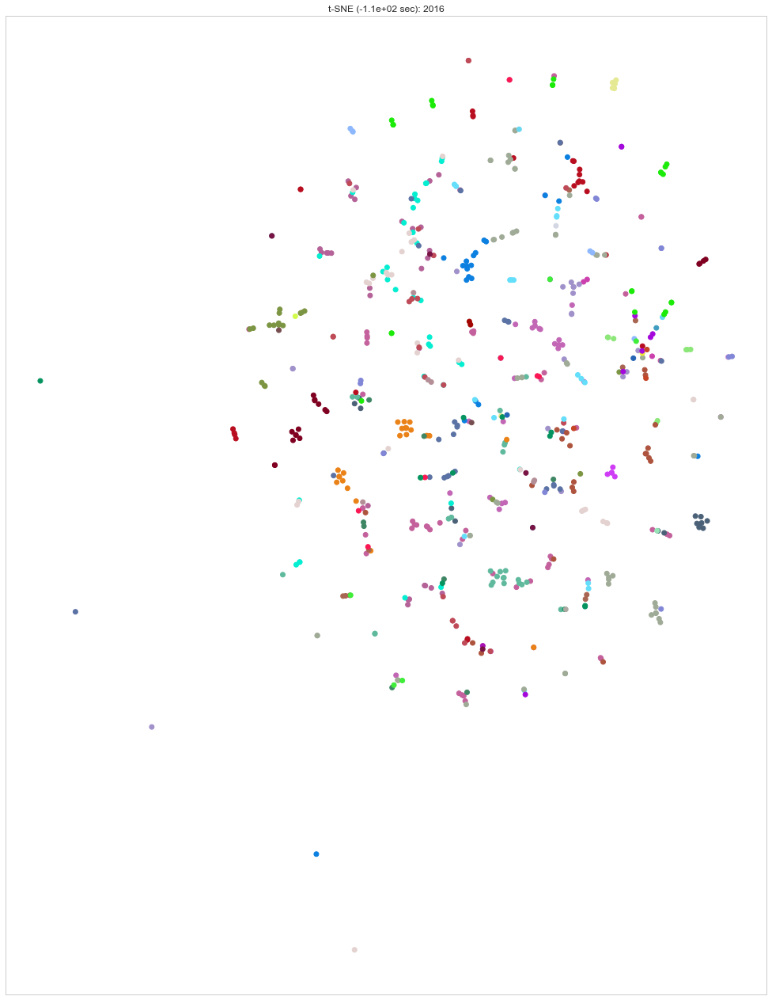

In [38]:
#Plot the t-SNE model
plotTSNE1()

# [1.8] Now let's add the talk titles to the Modified TFIDF t-SNE MODEL with the HASH injection (The Prince's Model) 

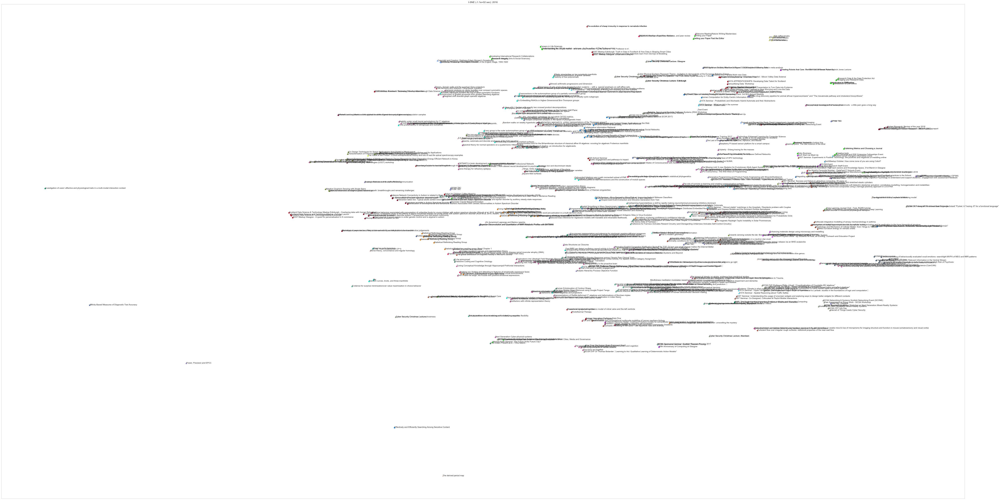

In [39]:
#Plot t-SNE with the labels

def plotwithLabel():
    df = pd.DataFrame( index = tfModel2['hue1'],columns=['x', 'y'])
    df['x'] = tfModel2['x'].values
    df['y'] = tfModel2['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model2)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    #talk_Model2['x'] = df['x']
    #talk_Model2['y'] = df['y'] 
    
    #Save to model to JSON file
    tfModel2.to_json('tfidf-tSNE-Hash'+str(year_entered)+'.json')
    
    return plt.show()

plotwithLabel()

# [1.9] Now let's add the talk series shortnames to the Modified TFIDF t-SNE MODEL with the HASH injection (The Prince's Model)

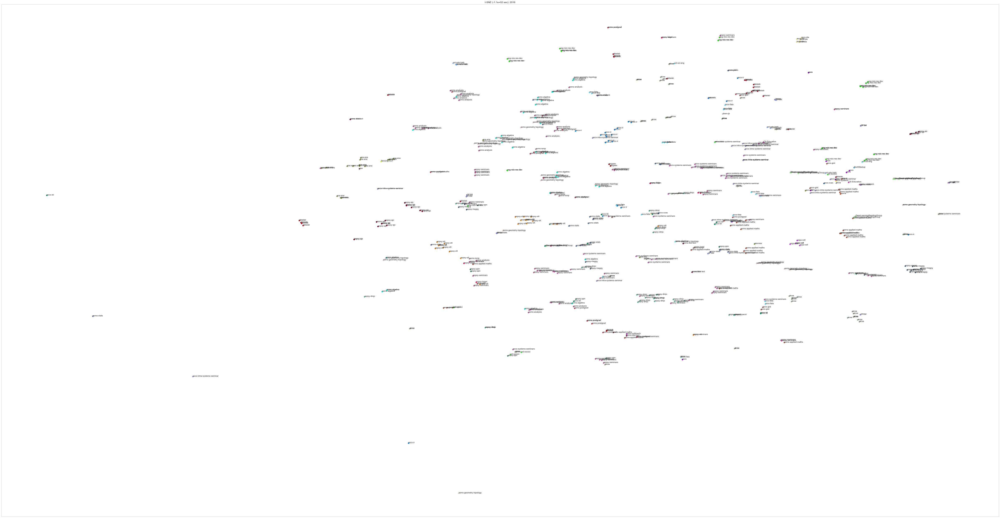

In [40]:
#Plot t-SNE with the labels

def plotwithLabel1():
    df = pd.DataFrame( index = tfModel2['hue'],columns=['x', 'y'])
    df['x'] = tfModel2['x'].values
    df['y'] = tfModel2['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model2)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    return plt.show()

if talk_Model2.empty:
    print("No Topics available")
else:
    plotwithLabel1()

# [1.10] Plot the interactive TFIDF t-SNE model showing all series in colour

In [41]:
#Let's build the t-SNE interactive model

from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

source = ColumnDataSource(data=dict(
    x = tfModel2.x,
            y = tfModel2.y,
            colors = data,
            title = tfModel2['hue1'],
            series = tfModel2['hue'],
            time = tfModel2['time'],
            link = tfModel2['ref'],
            alpha = [0.9] * model2.shape[0],
            size = [7] * model2.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# [2] Topic Modelling and Latent Dirichlet Allocation (LDA) in Python and its t-SNE visualisation

In [42]:
#Now plots present the LDA visualisation 

#Let's use a new dataframe
talk_Model5 = talk_Model.copy(deep=True)
talk_Model5['clean_description_lda'] = talk_Model5['clean_description']
talk_Model5.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription,Description1,clean_description_lda
id,,,,,,,,,,,,,
522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education,724,\r\r\nWe have used broadly the same assessment...,522,ComputingScienceEducationResearchandPractice,\r\r\nWe have used broadly the same assessment...,\r\r\nWe have used broadly the same assessment...
8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars,720,While patients with right parietal damage negl...,8111,SeminarSeries,While patients with right parietal damage negl...,While patients with right parietal damage negl...
492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars,719,"In recent years, software testing research has...",492,SystemsSeminars,"In recent years, software testing research has...","In recent years, software testing research has..."
527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education,717,How do we teach Computer Science to our univer...,527,ComputingScienceEducationResearchandPractice,How do we teach Computer Science to our univer...,How do we teach Computer Science to our univer...
8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg,714,Please all come.\r\n\r\nFirst meeting after su...,8110,MEGReadingGroup,Please all come.\r\n\r\nFirst meeting after su...,Please all come.\r\n\r\nFirst meeting after su...


In [43]:
# Removing numerals:
talk_Model5['clean_description_lda'] = talk_Model5['clean_description_lda'].map(lambda x: re.sub(r'\d+', '', x))


In [44]:
# Lower case:
talk_Model5['clean_description_lda'] = talk_Model5['clean_description_lda'].map(lambda x: x.lower())

In [45]:
print(talk_Model5['clean_description'][:5])

id
522     \r\r\nWe have used broadly the same assessment...
8111    While patients with right parietal damage negl...
492     In recent years, software testing research has...
527     How do we teach Computer Science to our univer...
8110    Please all come.\r\n\r\nFirst meeting after su...
Name: clean_description, dtype: object


In [46]:
#Tokenise each word in each talk abstract
talk_Model5['clean_description_lda']  = talk_Model5['clean_description_lda'] .map(lambda x: RegexpTokenizer(r'\w+').tokenize(x))
print(talk_Model5['clean_description_lda'].head())

id
522     [we, have, used, broadly, the, same, assessmen...
8111    [while, patients, with, right, parietal, damag...
492     [in, recent, years, software, testing, researc...
527     [how, do, we, teach, computer, science, to, ou...
8110    [please, all, come, first, meeting, after, sum...
Name: clean_description_lda, dtype: object


In [47]:
#Perform the stemming for the words
talk = SnowballStemmer("english")  
talk_Model5['clean_description_lda'] = talk_Model5['clean_description_lda'].map(lambda x: [talk.stem(token)for token in x])

In [48]:
#Remove the stop words
stop_en = stopwords.words('english')
talk_Model5['clean_description'] = talk_Model5['clean_description_lda'].map(lambda x: [t for t in x if t not in stop_en]) 
print(talk_Model5['clean_description'].head())

id
522     [use, broad, assess, feedback, practic, school...
8111    [patient, right, pariet, damag, neglect, left,...
492     [recent, year, softwar, test, research, produc...
527     [teach, comput, scienc, univers, student, make...
8110    [pleas, come, first, meet, summer, break, cove...
Name: clean_description, dtype: object


In [49]:
#Keep only words of length greater then 1
talk_Model5['clean_description'] = talk_Model5['clean_description_lda'].map(lambda x: [t for t in x if len(t) > 1])
print(talk_Model5['clean_description'].head())

id
522     [we, have, use, broad, the, same, assess, and,...
8111    [while, patient, with, right, pariet, damag, n...
492     [in, recent, year, softwar, test, research, ha...
527     [how, do, we, teach, comput, scienc, to, our, ...
8110    [pleas, all, come, first, meet, after, summer,...
Name: clean_description, dtype: object


In [50]:
#Let's build the corpus and train the model
from gensim import corpora, models
np.random.seed(2017)
texts = talk_Model5['clean_description_lda'].values
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
ldamodel = models.ldamodel.LdaModel(corpus, id2word=dictionary, 
                                    num_topics=8, passes=5, minimum_probability=0)

In [51]:
#Let the values of the corpus
hm = np.array([[y for (x,y) in ldamodel[corpus[i]]] for i in range(len(corpus))])

In [52]:
#Setup t-SNE, transform the LDA values, and insert the cordinates into a dataframe
tsne = TSNE(random_state=2017, perplexity=30)
tsne_embedding = tsne.fit_transform(hm)
tsne_embedding = pd.DataFrame(tsne_embedding, columns=['x','y'])
tsne_embedding['group'] = hm.argmax(axis=1)

In [53]:
#Build the t-SNE dataframe
tsne_embedding['hue'] = talk_Model['shortname'].values

tsne_embedding['hue1'] = talk_Model['title'].values

factor = pd.factorize(talk_Model['shortname'])

values_factor= pd.Series(factor[0][0:])

values_factor = DataFrame(values_factor)

tsne_embedding['hue_factor'] = values_factor.values

tsne_embedding.head()


,x,y,group,hue,hue1,hue_factor
0,-21.064240,-10.616768,5,CS-Education,Making our lives manageable!! Workshop to Reco...,0
1,-17.932076,-7.149451,5,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1
2,-4.029781,18.138546,1,socs-systems-seminars,Systems Seminar: Sorting Sheep from Goats - Au...,2
3,-0.428983,6.132259,5,CS-Education,Technology Enhanced Learning for Computer Science,0
4,13.287644,14.276191,2,sopsy-megrg,Getting in gear with MEG,3


In [54]:
#Build the t-SNE datframe

tsne_embedding1 = pd.DataFrame(columns=['x','y'])

tsne_embedding1['x'] = tsne_embedding ['x'].values

tsne_embedding1['y'] = tsne_embedding ['y'].values

tsne_embedding1['hue'] = tsne_embedding['hue'].values

tsne_embedding1['title'] = tsne_embedding['hue1'].values

tsne_embedding1['hue1'] = tsne_embedding['hue_factor'].values

tsne_embedding1['time'] = talk_Model5['starttime'].values

tsne_embedding1['group'] =  tsne_embedding['group'].values

tsne_embedding1['ref'] = talk_Model5['refID'].values

tsne_embedding1.set_index('hue')

tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-21.064240,-10.616768,CS-Education,Making our lives manageable!! Workshop to Reco...,0,2016-09-02 08:30:00,5,522
1,-17.932076,-7.149451,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1,2016-09-06 14:30:00,5,8111
2,-4.029781,18.138546,socs-systems-seminars,Systems Seminar: Sorting Sheep from Goats - Au...,2,2016-09-07 12:00:00,1,492
3,-0.428983,6.132259,CS-Education,Technology Enhanced Learning for Computer Science,0,2016-09-09 11:30:00,5,527
4,13.287644,14.276191,sopsy-megrg,Getting in gear with MEG,3,2016-09-12 10:00:00,2,8110


In [55]:
#Set the t-SNE dataframe in ascending order of hue1 (i.e. the factorisation of the shortname column)
tsne_embedding1 = tsne_embedding1.sort_values('hue1',ascending=True)

tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-21.064240,-10.616768,CS-Education,Making our lives manageable!! Workshop to Reco...,0,2016-09-02 08:30:00,5,522
3,-0.428983,6.132259,CS-Education,Technology Enhanced Learning for Computer Science,0,2016-09-09 11:30:00,5,527
384,-20.025900,-10.032763,CS-Education,CS for all - a new 3-15 CS curriculum for Scot...,0,2017-03-06 13:00:00,5,2679
1,-17.932076,-7.149451,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1,2016-09-06 14:30:00,5,8111
202,-6.376287,24.514076,sopsy-seminars,Social motivations in choice: insights from de...,1,2016-12-02 15:30:00,1,8133


In [56]:
#View the dataframe
tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-21.064240,-10.616768,CS-Education,Making our lives manageable!! Workshop to Reco...,0,2016-09-02 08:30:00,5,522
3,-0.428983,6.132259,CS-Education,Technology Enhanced Learning for Computer Science,0,2016-09-09 11:30:00,5,527
384,-20.025900,-10.032763,CS-Education,CS for all - a new 3-15 CS curriculum for Scot...,0,2017-03-06 13:00:00,5,2679
1,-17.932076,-7.149451,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1,2016-09-06 14:30:00,5,8111
202,-6.376287,24.514076,sopsy-seminars,Social motivations in choice: insights from de...,1,2016-12-02 15:30:00,1,8133


# 2.1 Plot the LDA t-SNE model with the shortname

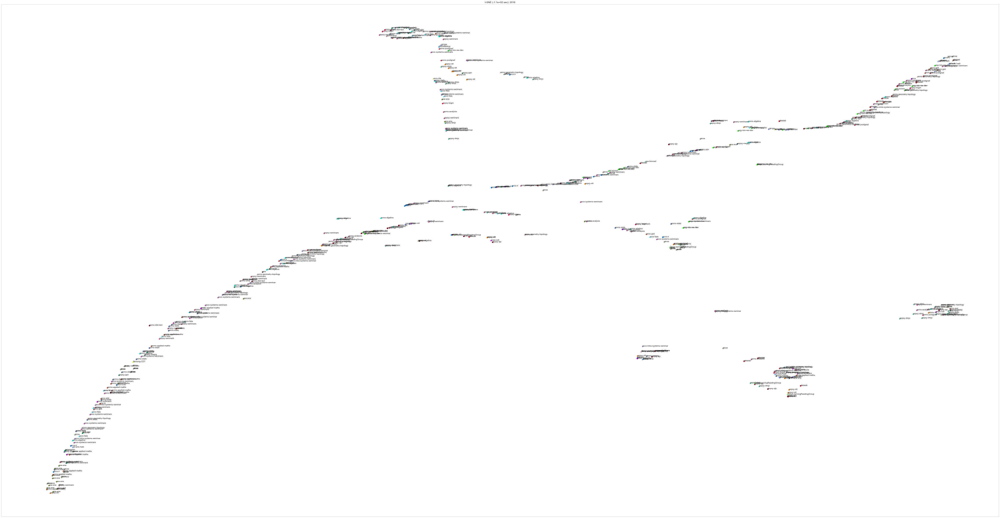

In [57]:
#Plot the t-SNE model with the shortname
def plotwithLabel():
    df = pd.DataFrame( index = tsne_embedding1['hue'],columns=['x', 'y'])
    df['x'] = tsne_embedding1['x'].values
    df['y'] = tsne_embedding1['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c= data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    talk_Model5['x'] = tsne_embedding1['x']
    talk_Model5['y'] = tsne_embedding1['y']
    

    return plt.show()

plotwithLabel()

# 2.2 Plot the LDA-t-SNE model with the title

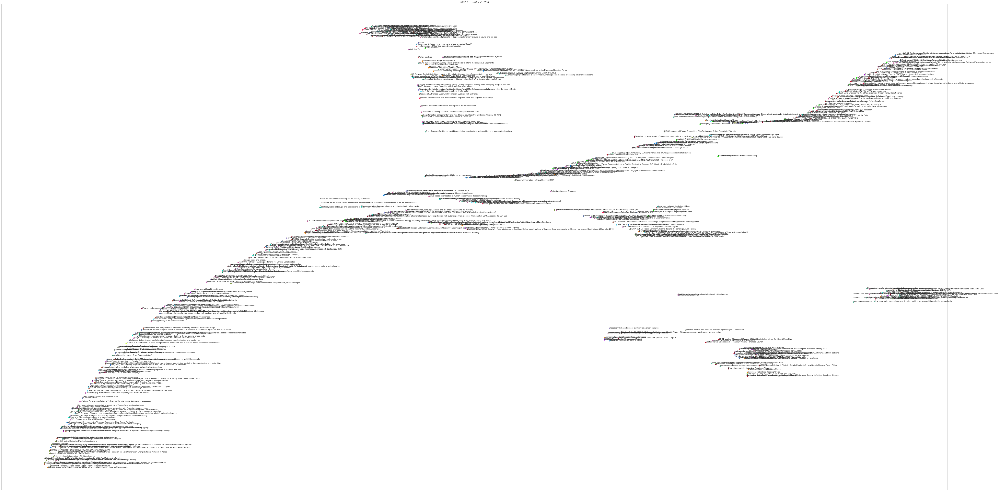

In [58]:
#Plot the t-SNE model with the title
def plotwithLabel():
    df = pd.DataFrame( index = tsne_embedding1['title'],columns=['x', 'y'])
    df['x'] = tsne_embedding1['x'].values
    df['y'] = tsne_embedding1['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    talk_Model5['x'] = tsne_embedding1['x']
    talk_Model5['y'] = tsne_embedding1['y']
    
    #Save to model to JSON file
    talk_Model5.to_json('LDA-tSNE'+str(year_entered)+'.json')
    return plt.show()

plotwithLabel()

# 2.3 Plot the interactive LDA t-SNE model showing all series in colour

In [59]:
#Plot the interactive LDA t-SNE model
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


source = ColumnDataSource(data=dict(
    x = tsne_embedding1.x,
            y = tsne_embedding1.y,
            colors = data,
            title = tsne_embedding1['title'],
            series = tsne_embedding1['hue'],
            time = tsne_embedding1['time'],
            link = tsne_embedding1['ref'],
            alpha = [0.9] * tsne_embedding.shape[0],
            size = [7] * tsne_embedding.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)


#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']

plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# 2.4 Plot showing the different LDA aggregated talks into groups in colour

In [60]:
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


source = ColumnDataSource(data=dict(
    x = tsne_embedding1.x,
            y = tsne_embedding1.y,
            colors = [all_palettes['Set1'][8][i] for i in tsne_embedding1.group],
            title = tsne_embedding1['title'],
            series = tsne_embedding1['hue'],
            time = tsne_embedding1['time'],
            link = tsne_embedding1['ref'],
            alpha = [0.9] * tsne_embedding.shape[0],
            size = [7] * tsne_embedding.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']


plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# 2.5 LDA t-SNE Visualisation with hash injection method showing series

In [61]:
#Set the dataframe
talk_Model6 = talk_Model.copy(deep=True)

talk_Model6['clean_description_ldaHash'] = talk_Model6['Description1']

talk_Model6.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription,Description1,clean_description_ldaHash
id,,,,,,,,,,,,,
522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education,724,\r\r\nWe have used broadly the same assessment...,522,ComputingScienceEducationResearchandPractice,\r\r\nWe have used broadly the same assessment...,\r\r\nWe have used broadly the same assessment...
8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars,720,While patients with right parietal damage negl...,8111,SeminarSeries,While patients with right parietal damage negl...,While patients with right parietal damage negl...
492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars,719,"In recent years, software testing research has...",492,SystemsSeminars,"In recent years, software testing research has...","In recent years, software testing research has..."
527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education,717,How do we teach Computer Science to our univer...,527,ComputingScienceEducationResearchandPractice,How do we teach Computer Science to our univer...,How do we teach Computer Science to our univer...
8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg,714,Please all come.\r\n\r\nFirst meeting after su...,8110,MEGReadingGroup,Please all come.\r\n\r\nFirst meeting after su...,Please all come.\r\n\r\nFirst meeting after su...


In [62]:
# Removing numerals:
talk_Model6['clean_description_lda'] = talk_Model6['clean_description_ldaHash'].map(lambda x: re.sub(r'\d+', '', x))


In [63]:
# Lower case:
talk_Model6['clean_description_ldaHash'] = talk_Model6['clean_description_ldaHash'].map(lambda x: x.lower())

In [64]:
talk_Model6['clean_description_ldaHash']  = talk_Model6['clean_description_ldaHash'] .map(lambda x: RegexpTokenizer(r'\w+').tokenize(x))
print(talk_Model6['clean_description_ldaHash'].head())

id
522     [we, have, used, broadly, the, same, assessmen...
8111    [while, patients, with, right, parietal, damag...
492     [in, recent, years, software, testing, researc...
527     [how, do, we, teach, computer, science, to, ou...
8110    [please, all, come, first, meeting, after, sum...
Name: clean_description_ldaHash, dtype: object


In [65]:
#Stem the words
talk = SnowballStemmer("english")  
talk_Model6['clean_description_ldaHash'] = talk_Model6['clean_description_ldaHash'].map(lambda x: [talk.stem(token)for token in x])

In [66]:
#Remove all stop words
stop_en = stopwords.words('english')
talk_Model6['clean_description_ldaHash'] = talk_Model6['clean_description_ldaHash'].map(lambda x: [t for t in x if t not in stop_en]) 
print(talk_Model6['clean_description_ldaHash'].head())

id
522     [use, broad, assess, feedback, practic, school...
8111    [patient, right, pariet, damag, neglect, left,...
492     [recent, year, softwar, test, research, produc...
527     [teach, comput, scienc, univers, student, make...
8110    [pleas, come, first, meet, summer, break, cove...
Name: clean_description_ldaHash, dtype: object


In [67]:
talk_Model6['clean_description_ldaHash'] = talk_Model6['clean_description_ldaHash'].map(lambda x: [t for t in x if len(t) > 1])

In [68]:
#Build the vocabulary
from gensim import corpora, models
np.random.seed(2017)
texts = talk_Model6['clean_description_ldaHash'].values
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
ldamodel = models.ldamodel.LdaModel(corpus, id2word=dictionary, 
                                    num_topics=8, passes=5, minimum_probability=0)

In [69]:
#Get the values of the corpus
hm = np.array([[y for (x,y) in ldamodel[corpus[i]]] for i in range(len(corpus))])

In [70]:
#Build the t-SNE model and insert the coordinates to the datframe
tsne = TSNE(random_state=2017, perplexity=30)
tsne_embedding = tsne.fit_transform(hm)
tsne_embedding = pd.DataFrame(tsne_embedding, columns=['x','y'])
tsne_embedding['group'] = hm.argmax(axis=1)

In [71]:
#Build the tsne dataframe
tsne_embedding['hue'] = talk_Model['shortname'].values

tsne_embedding['hue1'] = talk_Model['title'].values

factor = pd.factorize(talk_Model['shortname'])

values_factor= pd.Series(factor[0][0:])

values_factor = DataFrame(values_factor)

tsne_embedding['hue_factor'] = values_factor.values



In [72]:
#Build the data Frame
tsne_embedding1 = pd.DataFrame(columns=['x','y'])

tsne_embedding1['x'] = tsne_embedding ['x'].values

tsne_embedding1['y'] = tsne_embedding ['y'].values

tsne_embedding1['hue'] = tsne_embedding['hue'].values

tsne_embedding1['title'] = tsne_embedding['hue1'].values

tsne_embedding1['hue1'] = tsne_embedding['hue_factor'].values

tsne_embedding1['time'] = talk_Model6['starttime'].values

tsne_embedding1['group'] = tsne_embedding['group'].values

tsne_embedding1['ref'] = talk_Model6['refID'].values

tsne_embedding1.set_index('hue')

tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-7.028324,10.979885,CS-Education,Making our lives manageable!! Workshop to Reco...,0,2016-09-02 08:30:00,3,522
1,2.612730,38.179451,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1,2016-09-06 14:30:00,2,8111
2,-22.200436,4.393744,socs-systems-seminars,Systems Seminar: Sorting Sheep from Goats - Au...,2,2016-09-07 12:00:00,0,492
3,8.032189,3.745421,CS-Education,Technology Enhanced Learning for Computer Science,0,2016-09-09 11:30:00,6,527
4,5.841225,-28.799187,sopsy-megrg,Getting in gear with MEG,3,2016-09-12 10:00:00,1,8110


In [73]:
#Set t-SNE datframe in ascending order in other to attribute colours properly
tsne_embedding1 = tsne_embedding1.sort_values('hue1',ascending=True)

tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-7.028324,10.979885,CS-Education,Making our lives manageable!! Workshop to Reco...,0,2016-09-02 08:30:00,3,522
3,8.032189,3.745421,CS-Education,Technology Enhanced Learning for Computer Science,0,2016-09-09 11:30:00,6,527
384,8.429759,3.988505,CS-Education,CS for all - a new 3-15 CS curriculum for Scot...,0,2017-03-06 13:00:00,6,2679
1,2.612730,38.179451,sopsy-seminars,"Spatial asymmetries in action, perception and ...",1,2016-09-06 14:30:00,2,8111
202,-8.708826,7.648545,sopsy-seminars,Social motivations in choice: insights from de...,1,2016-12-02 15:30:00,3,8133


# 4.6 Plot the LDA t-SNE -Hash model with shortname

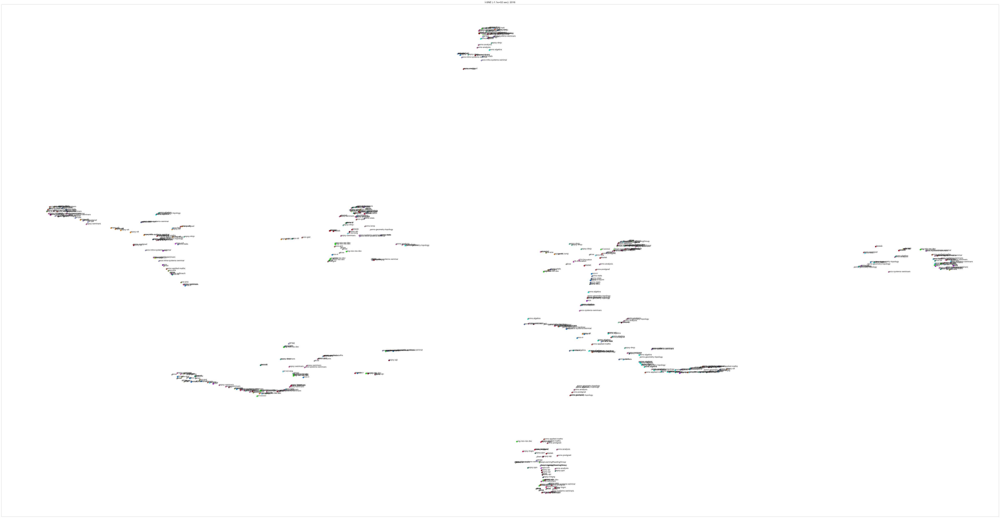

In [74]:
#Plot the LDA t-SNE model with shortname
def plotwithLabel():
    df = pd.DataFrame( index = tsne_embedding1['hue'],columns=['x', 'y'])
    df['x'] = tsne_embedding1['x'].values
    df['y'] = tsne_embedding1['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c= data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    talk_Model6['x'] = tsne_embedding1['x']
    talk_Model6['y'] = tsne_embedding1['y']
    
    return plt.show()

plotwithLabel()

# 4.7  Plot the LDA t-SNE -Hash model with title

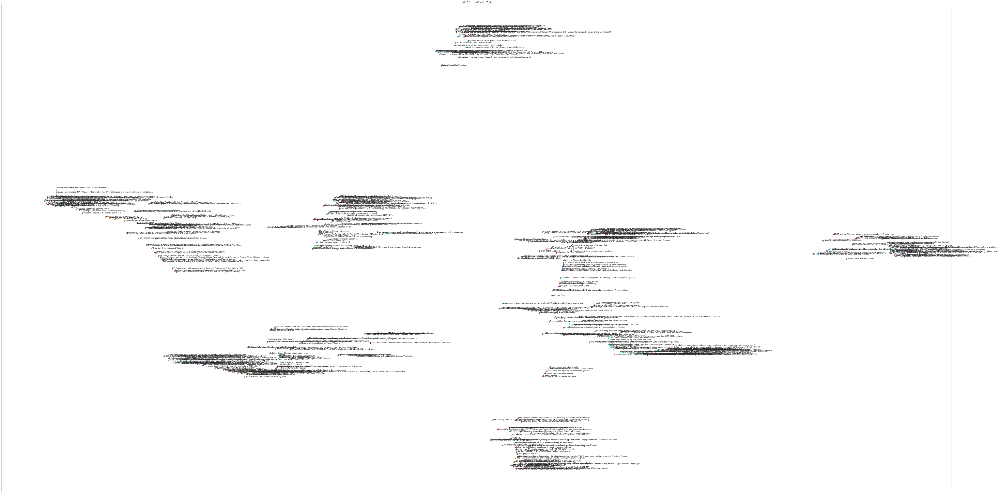

In [75]:
#Plot the LDA t-SNE model with title
def plotwithLabel():
    df = pd.DataFrame( index = tsne_embedding1['title'],columns=['x', 'y'])
    df['x'] = tsne_embedding1['x'].values
    df['y'] = tsne_embedding1['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    talk_Model6['x'] = tsne_embedding1['x']
    talk_Model6['y'] = tsne_embedding1['y']
    
    #Save to model to JSON file
    talk_Model6.to_json('LDA-tSNE-Hash'+str(year_entered)+'.json')
    return plt.show()

plotwithLabel()

# 4.8 Plot the interactive LDA t-SNE (Hash) model showing series

In [76]:
#
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

source = ColumnDataSource(data=dict(
    x = tsne_embedding1.x,
            y = tsne_embedding1.y,
            colors = data,
            title = tsne_embedding1['title'],
            series = tsne_embedding1['hue'],
            time = tsne_embedding1['time'],
            link = tsne_embedding1['ref'],
            alpha = [0.9] * tsne_embedding.shape[0],
            size = [7] * tsne_embedding.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# 4.9 Plot the interactive LDA t-SNE model showing LDA argmax

In [77]:
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


source = ColumnDataSource(data=dict(
    x = tsne_embedding1.x,
            y = tsne_embedding1.y,
            colors = [all_palettes['Set1'][8][i] for i in tsne_embedding1.group],
            title = tsne_embedding1['title'],
            series = tsne_embedding1['hue'],
            time = tsne_embedding1['time'],
            link = tsne_embedding1['ref'],
            alpha = [0.9] * tsne_embedding.shape[0],
            size = [7] * tsne_embedding.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']


plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# [3] Topic Modelling and Latent Dirichlet Allocation (LDA) in Python with Gensim (For topic search)

In [78]:
#Get the abstract content
dframe =DataFrame(talk_Model['clean_description'])

In [79]:
#Display the content
dframe.head(7)

,clean_description
id,
522,\r\r\nWe have used broadly the same assessment...
8111,While patients with right parietal damage negl...
492,"In recent years, software testing research has..."
527,How do we teach Computer Science to our univer...
8110,Please all come.\r\n\r\nFirst meeting after su...
8114,David will present the recent paper by Harris ...
2128,This old saying among weather forecasters is c...


In [80]:
#Add the indexex to the dataframe
data_text = dframe[['clean_description']]
data_text['index'] = data_text.index

In [81]:
#Set name atritube as document
documents = data_text

In [82]:
#Print the dataframe
print(len(documents))
print(documents[:5])

618
                                      clean_description  index
id                                                            
522   \r\r\nWe have used broadly the same assessment...    522
8111  While patients with right parietal damage negl...   8111
492   In recent years, software testing research has...    492
527   How do we teach Computer Science to our univer...    527
8110  Please all come.\r\n\r\nFirst meeting after su...   8110


In [83]:
#Add the relevant natural language processing libraries
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
from nltk import PorterStemmer
import numpy as np
np.random.seed(2018)
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [84]:
#Now let's write methods to lammatise and stem the words
def lemmatize_stemming(text):
    return PorterStemmer().stem(WordNetLemmatizer().lemmatize(text, pos='v'))
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

In [85]:
#Now process the words
processed_docs = documents['clean_description'].map(preprocess)
processed_docs[:10]

id
522     [broadli, assess, feedback, practic, school, d...
8111    [patient, right, pariet, damag, neglect, leav,...
492     [recent, year, softwar, test, research, produc...
527     [teach, scienc, univers, student, good, techno...
8110    [come, meet, summer, break, cover, news, view,...
8114    [david, present, recent, paper, harri, natur, ...
2128    [say, weather, forecast, correct, littl, insig...
8170    [data, function, organ, hippocamp, memori, cir...
2127    [paper, introduc, wavenet, deep, neural, netwo...
8112    [stereopsi, abil, perceiv, depth, small, dispa...
Name: clean_description, dtype: object

In [86]:
#For a bag of words
dictionary = gensim.corpora.Dictionary(processed_docs)
count = 0
for k, v in dictionary.iteritems():
    count += 1 
    
str(count) + ' words in the dictionary'

'6235 words in the dictionary'

In [87]:
#Keep all tokens
#Hence sent no_below to zero and no_above to maximum (1)
dictionary.filter_extremes(no_below=0, no_above=1, keep_n=100000)

In [88]:
#For each document create number of words and how many times it appears
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]
#bow_corpus[100].

In [89]:
#Review the bags of words for each preprocessed document
bow_doc_2993 = bow_corpus[200]
for i in range(len(bow_doc_2993)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_2993[i][0], 
                                               dictionary[bow_doc_2993[i][0]], 
bow_doc_2993[i][1]))

Word 22 ("level") appears 1 time.
Word 24 ("mark") appears 1 time.
Word 29 ("offer") appears 1 time.
Word 42 ("time") appears 2 time.
Word 57 ("damag") appears 1 time.
Word 82 ("recent") appears 1 time.
Word 96 ("advanc") appears 1 time.
Word 99 ("analyt") appears 4 time.
Word 104 ("area") appears 1 time.
Word 109 ("behaviour") appears 1 time.
Word 120 ("data") appears 2 time.
Word 127 ("experi") appears 2 time.
Word 140 ("investig") appears 1 time.
Word 142 ("larg") appears 4 time.
Word 148 ("model") appears 9 time.
Word 149 ("need") appears 1 time.
Word 153 ("order") appears 1 time.
Word 159 ("possibl") appears 1 time.
Word 171 ("scale") appears 3 time.
Word 182 ("talk") appears 1 time.
Word 190 ("year") appears 1 time.
Word 195 ("develop") appears 1 time.
Word 202 ("interact") appears 3 time.
Word 224 ("natur") appears 1 time.
Word 228 ("present") appears 1 time.
Word 234 ("appli") appears 1 time.
Word 241 ("chang") appears 1 time.
Word 244 ("close") appears 1 time.
Word 296 ("predi

In [90]:
#Let's create a tfidf model and also transform it
from gensim import corpora, models
tfidf = models.TfidfModel(bow_corpus)
print(tfidf)
corpus_tfidf = tfidf[bow_corpus]


TfidfModel(num_docs=618, num_nnz=34322)


In [92]:
#print the tfidf valves for each word
#for doc in corpus_tfidf:
      #for index, value in doc:
        #print (index,value)

In [93]:
#Let's train the LDA model
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, id2word=dictionary, passes=2, workers=2)

In [94]:
#Let's check the weight of words in each topic
for idx, topic in lda_model.print_topics(1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 7 
Words: 0.010*"algebra" + 0.009*"structur" + 0.007*"group" + 0.007*"space" + 0.007*"talk" + 0.006*"work" + 0.006*"theori" + 0.005*"prof" + 0.005*"ndash" + 0.005*"model"


In [95]:
#Let us seperate words in each topic by using words in the topic
#We will run LDA using tfidf
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dictionary, passes=2, workers=4)
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.003*"data" + 0.002*"model" + 0.002*"robot" + 0.002*"research" + 0.002*"univers" + 0.002*"plan" + 0.002*"action" + 0.002*"learn" + 0.001*"dmponlin" + 0.001*"manag"
Topic: 1 Word: 0.002*"data" + 0.002*"event" + 0.002*"research" + 0.002*"workshop" + 0.002*"sicsa" + 0.001*"meet" + 0.001*"quantum" + 0.001*"univers" + 0.001*"network" + 0.001*"devic"
Topic: 2 Word: 0.002*"model" + 0.001*"mathemat" + 0.001*"confid" + 0.001*"problem" + 0.001*"action" + 0.001*"group" + 0.001*"infect" + 0.001*"optim" + 0.001*"space" + 0.001*"rough"
Topic: 3 Word: 0.002*"catch" + 0.002*"chanc" + 0.002*"chapter" + 0.002*"section" + 0.002*"model" + 0.002*"room" + 0.002*"meet" + 0.002*"common" + 0.002*"member" + 0.002*"scienc"
Topic: 4 Word: 0.002*"data" + 0.002*"beer" + 0.002*"pizza" + 0.002*"learn" + 0.001*"social" + 0.001*"busi" + 0.001*"hopf" + 0.001*"algebra" + 0.001*"relax" + 0.001*"even"
Topic: 5 Word: 0.002*"languag" + 0.001*"map" + 0.001*"network" + 0.001*"train" + 0.001*"interact" + 0.001*"

In [96]:
#Let us seperate words in each topic by using words in the topic
#We will run LDA using bag of words
for index, score in sorted(lda_model[bow_corpus[300]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.8073310256004333	 
Topic: 0.010*"model" + 0.009*"data" + 0.008*"activ" + 0.006*"studi" + 0.006*"present" + 0.006*"genom" + 0.006*"result" + 0.005*"system" + 0.005*"network" + 0.005*"talk"

Score: 0.1110387071967125	 
Topic: 0.010*"model" + 0.008*"group" + 0.008*"network" + 0.008*"univers" + 0.007*"talk" + 0.006*"data" + 0.006*"research" + 0.005*"present" + 0.005*"problem" + 0.005*"decis"

Score: 0.0737629160284996	 
Topic: 0.009*"decis" + 0.007*"system" + 0.007*"model" + 0.006*"work" + 0.006*"social" + 0.005*"experi" + 0.005*"research" + 0.005*"present" + 0.005*"univers" + 0.005*"effect"


In [97]:
#Performance evaluation
#The test document has a high probability to be part of the topic
#that the model assigned
for index, score in sorted(lda_model_tfidf[bow_corpus[300]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model_tfidf.print_topic(index, 10)))


Score: 0.59953773021698	 
Topic: 0.002*"catch" + 0.002*"chanc" + 0.002*"chapter" + 0.002*"section" + 0.002*"model" + 0.002*"room" + 0.002*"meet" + 0.002*"common" + 0.002*"member" + 0.002*"scienc"

Score: 0.181767076253891	 
Topic: 0.003*"data" + 0.002*"model" + 0.002*"robot" + 0.002*"research" + 0.002*"univers" + 0.002*"plan" + 0.002*"action" + 0.002*"learn" + 0.001*"dmponlin" + 0.001*"manag"

Score: 0.10594300180673599	 
Topic: 0.002*"data" + 0.002*"event" + 0.002*"research" + 0.002*"workshop" + 0.002*"sicsa" + 0.001*"meet" + 0.001*"quantum" + 0.001*"univers" + 0.001*"network" + 0.001*"devic"

Score: 0.08895497769117355	 
Topic: 0.002*"languag" + 0.001*"map" + 0.001*"network" + 0.001*"train" + 0.001*"interact" + 0.001*"experi" + 0.001*"group" + 0.001*"genom" + 0.001*"dream" + 0.001*"algebra"

Score: 0.018178027123212814	 
Topic: 0.003*"algebra" + 0.002*"group" + 0.002*"theori" + 0.002*"categori" + 0.002*"logic" + 0.002*"network" + 0.002*"space" + 0.002*"research" + 0.002*"model" + 0.

In [98]:
#View talk titles in rows
talk_Model.iloc[547]['title']

'SICSA Sponsored Seminar: Scottish Theorem Proving 2017'

In [99]:
#View talk titles in rows
talk_Model.iloc[2]['title']

'Systems Seminar: Sorting Sheep from Goats - Automatically Clustering and Classifying Program Failures'

In [100]:
#Now do word check
#Method to search for words 
def search_words():
    process = True
    while process:
        try:
            searched_word = input("Please enter the word you wish to search: ")
            return searched_word
        except:
            print ("!!Invalid input data, please enter the right data")

#Enter word now
searched_word = search_words()


Please enter the word you wish to search: talk


In [101]:
#Now let's text new documents
unseen_document = searched_word
bow_vector = dictionary.doc2bow(preprocess(unseen_document))
for index, score in sorted(lda_model[bow_vector], key=lambda tup: -1*tup[1]):
    print("Score: {}\t Topic: {}\t{} \n\n".format(score, talk_Model.iloc[index]['title'], lda_model.print_topic(index, 4)))

Score: 0.5498613119125366	 Topic: Systems Seminar: Sorting Sheep from Goats - Automatically Clustering and Classifying Program Failures	0.010*"robot" + 0.010*"interact" + 0.008*"social" + 0.008*"human" 


Score: 0.050023287534713745	 Topic: Technology Enhanced Learning for Computer Science	0.012*"univers" + 0.010*"research" + 0.008*"talk" + 0.007*"work" 


Score: 0.05002027004957199	 Topic: Stereoscopic depth perception in humans and insects	0.010*"model" + 0.008*"group" + 0.008*"network" + 0.008*"univers" 


Score: 0.05001986771821976	 Topic: Functional anatomy and plasticity of hippocampal memory circuits in young and old age	0.010*"algebra" + 0.009*"structur" + 0.007*"group" + 0.007*"space" 


Score: 0.05001620203256607	 Topic: Getting in gear with MEG	0.013*"research" + 0.008*"model" + 0.007*"system" + 0.007*"work" 


Score: 0.05001513659954071	 Topic: Perceptual learning in autism	0.032*"data" + 0.011*"secur" + 0.010*"cyber" + 0.008*"inform" 


Score: 0.0500132218003273	 Topic: De

# [4] The following section presents the word2vec model and visualisation of all the abstract words that can be use d to enable accurate predictive searches.

In [102]:
#Let's prepare a dataframe for the word2Vec model
talk_Model4= talk_Model
talk_Model4.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription,Description1
id,,,,,,,,,,,,
522,Making our lives manageable!! Workshop to Reco...,"<blockquote cite=""mid:D85EB097-F25D-44AA-954F-...",2016-09-02 08:30:00,NaN,25,Computing Science Education Research and Practice,CS-Education,724,\r\r\nWe have used broadly the same assessment...,522,ComputingScienceEducationResearchandPractice,\r\r\nWe have used broadly the same assessment...
8111,"Spatial asymmetries in action, perception and ...",While patients with right parietal damage negl...,2016-09-06 14:30:00,Flinders University Australia,96,Seminar Series,sopsy-seminars,720,While patients with right parietal damage negl...,8111,SeminarSeries,While patients with right parietal damage negl...
492,Systems Seminar: Sorting Sheep from Goats - Au...,"<p>In recent years, software testing research ...",2016-09-07 12:00:00,University of Strathclyde,27,Systems Seminars,socs-systems-seminars,719,"In recent years, software testing research has...",492,SystemsSeminars,"In recent years, software testing research has..."
527,Technology Enhanced Learning for Computer Science,"<p class=""post-meta"">How do we teach Computer ...",2016-09-09 11:30:00,various,25,Computing Science Education Research and Practice,CS-Education,717,How do we teach Computer Science to our univer...,527,ComputingScienceEducationResearchandPractice,How do we teach Computer Science to our univer...
8110,Getting in gear with MEG,Please all come.\r\n\r\nFirst meeting after su...,2016-09-12 10:00:00,NaN,105,MEG Reading Group,sopsy-megrg,714,Please all come.\r\n\r\nFirst meeting after su...,8110,MEGReadingGroup,Please all come.\r\n\r\nFirst meeting after su...


In [103]:
#Import the necessary modules
from __future__ import absolute_import, division, print_function
import pandas as pd

In [104]:
# Convert all the review text into a long string 
#and print its length# Conve 
raw_info = u''.join(talk_Model['clean_description']+" ")
print("Raw info contains {0:,} characters".format(len(raw_info)))

Raw info contains 600,550 characters


In [105]:
# import natural language toolkit
import nltk
# download the punkt tokenizer
nltk.download('punkt')
print("The punkt tokenizer is downloaded")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
The punkt tokenizer is downloaded


In [106]:
# Load the punkt tokenizer
tokenizer = nltk.data.load("tokenizers/punkt/english.pickle")
print("The punkt tokenizer is loaded")
# Let's tokenize the raw string into raw sentences
raw_sentences = tokenizer.tokenize(raw_info)
print("We have {0:,} raw sentences".format(len(raw_sentences)))

The punkt tokenizer is loaded
We have 3,677 raw sentences


In [107]:
import re
# Clean and split sentence into words
def clean_and_split_str(string):
    strip_special_chars = re.compile("[^A-Za-z]+")
    string = re.sub(strip_special_chars, " ", string)
    return string.strip().split()

In [108]:
# Let's clean each raw sentences and then build a sentence list
sentences = []
for raw_info in raw_sentences:
    if len(raw_info) > 0:
        sentences.append(clean_and_split_str(raw_info))
print("We have {0:,} clean sentences".format(len(sentences)))

We have 3,677 clean sentences


In [109]:
print(raw_sentences[30])
print()
print(sentences[30])

While weather can be understood and simulated as instabilities arising within  the atmosphere,  climate involves interactions and exchanges of properties among a wide variety of subsystems that include for example the atmosphere, the ocean and land subsystems.

['While', 'weather', 'can', 'be', 'understood', 'and', 'simulated', 'as', 'instabilities', 'arising', 'within', 'the', 'atmosphere', 'climate', 'involves', 'interactions', 'and', 'exchanges', 'of', 'properties', 'among', 'a', 'wide', 'variety', 'of', 'subsystems', 'that', 'include', 'for', 'example', 'the', 'atmosphere', 'the', 'ocean', 'and', 'land', 'subsystems']


In [110]:
import multiprocessing

#Resulting vector dimensions
num_features = 300

#Word count limit (minimum)
min_word_count = 3

#Number of threads to run in parallel
num_workers = multiprocessing.cpu_count()

#Context window length
context_size = 7

#Seed
seed = 1

import gensim

word2vec_model = gensim.models.word2vec.Word2Vec(
    sg=1,
    seed=seed,
    workers=num_workers, 
    size=num_features, 
    min_count=min_word_count, 
    window=context_size)

In [111]:
#Build the vocabulary
word2vec_model.build_vocab(sentences=sentences)
print("The vocabulary has been built")

The vocabulary has been built


In [112]:
#Start training the model
word2vec_model.train(sentences, total_examples=len(sentences), epochs=10)
print("Training finished")

Training finished


In [113]:
#Save the talk model
word2vec_model.save('word2vec_model_trained_on_talk_Model'+str(year_entered)+'.w2v')
print("Model saved")

Model saved


In [114]:
# Let's load our word2vec model
import gensim
w2v_model = gensim.models.word2vec.Word2Vec.load('word2vec_model_trained_on_talk_Model'+str(year_entered)+'.w2v')
print("Model loaded")

Model loaded


In [115]:
#Select 10000 words from our vocabulary
from __future__ import absolute_import, division, print_function
import numpy as np
count = 10010
word_vectors_matrix = np.ndarray(shape=(count, 300), dtype='float64')
word_list = []
i = 0
for word in w2v_model.wv.vocab:
    word_vectors_matrix[i] = w2v_model[word]
    word_list.append(word)
    i = i+1
    if i == count:
        break
print("word_vectors_matrix shape is ", word_vectors_matrix.shape)

word_vectors_matrix shape is  (10010, 300)


C:\Users\User\Anaconda\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


In [116]:
print(word2vec_model)

Word2Vec(vocab=4382, size=300, alpha=0.025)


In [117]:
#Compress the word vectors into 2D space
import sklearn.manifold
tsne = sklearn.manifold.TSNE(n_components=2, random_state=0,perplexity=50, verbose=40)
word_vectors_matrix_2d = tsne.fit_transform(word_vectors_matrix)
print("word_vectors_matrix_2d shape is ", word_vectors_matrix_2d.shape)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10010 samples in 0.354s...
[t-SNE] Computed neighbors for 10010 samples in 36.595s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10010
[t-SNE] Computed conditional probabilities for sample 2000 / 10010
[t-SNE] Computed conditional probabilities for sample 3000 / 10010
[t-SNE] Computed conditional probabilities for sample 4000 / 10010
[t-SNE] Computed conditional probabilities for sample 5000 / 10010
[t-SNE] Computed conditional probabilities for sample 6000 / 10010
[t-SNE] Computed conditional probabilities for sample 7000 / 10010
[t-SNE] Computed conditional probabilities for sample 8000 / 10010
[t-SNE] Computed conditional probabilities for sample 9000 / 10010
[t-SNE] Computed conditional probabilities for sample 10000 / 10010
[t-SNE] Computed conditional probabilities for sample 10010 / 10010
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 2.156s
[t-SNE] Iteration 50: error = 86.8

In [118]:
#Print the word vector cordinates
points = pd.DataFrame(
    [
        (word, coords[0], coords[1]) 
        for word, coords in [
            (word, word_vectors_matrix_2d[word_list.index(word)])
            for word in word_list
        ]
    ],
    columns=["word", "x", "y"]
)
print("Points DataFrame built")

Points DataFrame built


In [119]:
#View the word in the data frame
points.head()

,word,x,y
0,We,-50.825710,28.810871
1,have,-23.878151,-24.763420
2,used,-22.718348,34.123177
3,broadly,-30.898655,25.431417
4,the,-49.170811,15.961926


In [120]:
#print the words
points['word']

0                    We
1                  have
2                  used
3               broadly
4                   the
5                  same
6            assessment
7                   and
8              feedback
9             practices
10                   in
11               School
12                  for
13              decades
14                 they
15                 were
16             designed
17                 when
18                   we
19                  had
20              maximum
21                class
22                sizes
23                   of
24                  now
25                    L
26                    M
27                level
28              classes
29            regularly
             ...       
4352        Kehtarnavaz
4353               Real
4354              books
4355              Vijay
4356              Kumar
4357           Missouri
4358             Kansas
4359                PMR
4360         productive
4361     Communications
4362            

In [121]:
#Import libraries necessary for visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_context("poster")

# 4.1 A visualisation of all the word vectors in the talk abstract.

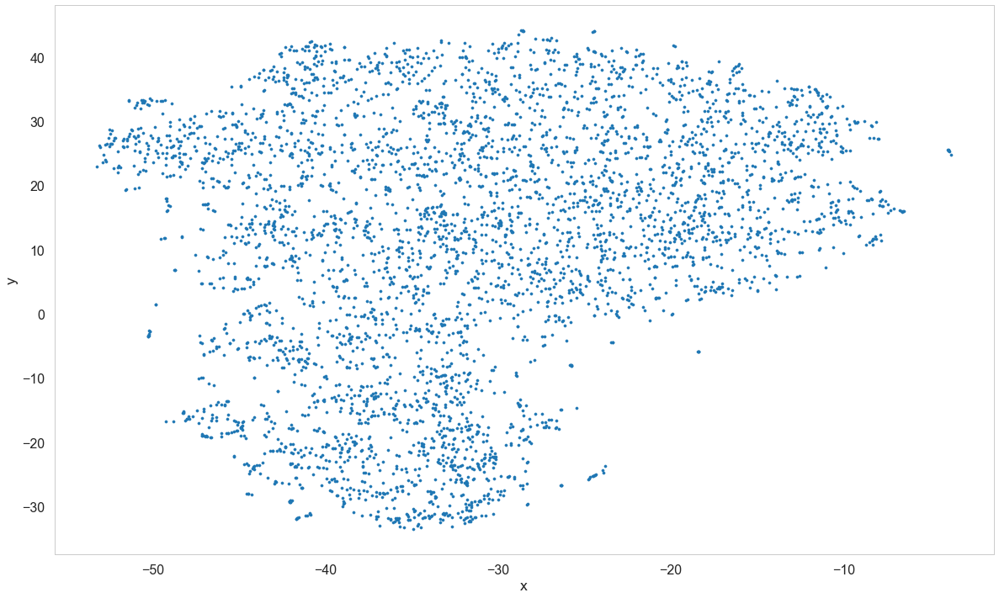

In [122]:
#Plot the word2vec visualisation
points.plot.scatter("x", "y", s=10, figsize=(20, 12), grid=False)


In [123]:
#Now do word check
#Method to search for words 
def search_words():
    process = True
    while process:
        try:
            searched_word = input("Please enter the word you wish to search: ")
            return searched_word
        except:
            print ("!!Invalid input data, please enter the right data")

#Enter word now
searched_word = search_words()


Please enter the word you wish to search: talk


In [124]:
#Most similar word check
try:
    a=word2vec_model.most_similar(searched_word)
    not_in_dict = 0
except:
    not_in_dict = 1
    print("Word is not in the word vec vocabulary")

C:\Users\User\Anaconda\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\User\Anaconda\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [125]:
#Print the results
if not_in_dict == 1:
    print('Not available')
else:
    a

In [126]:
#Set word as index
try:
    points.set_index('word', inplace=True)
    points.head()
except:
    print ('Error')

# 4.2 A visualisation of all the word vectors (with their corresponding words) in the talk abstract.

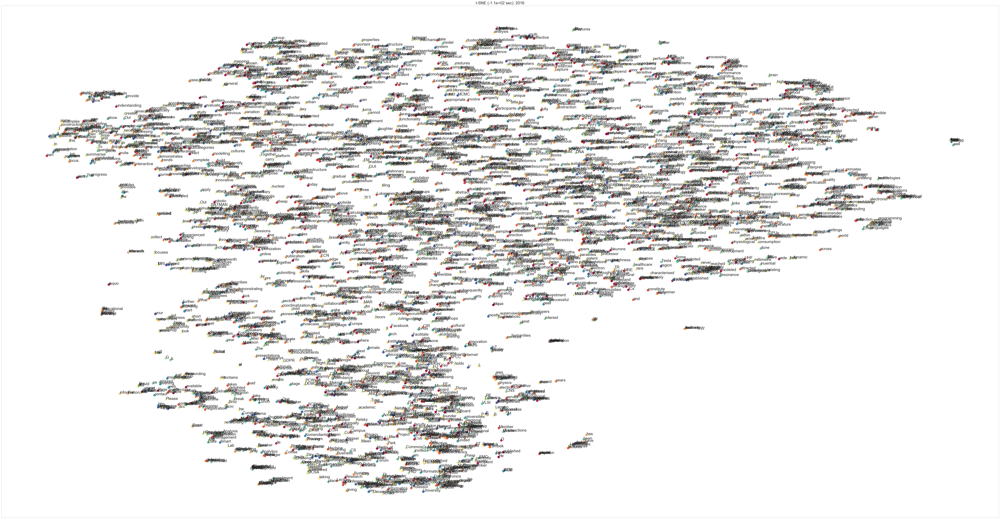

In [127]:
#Generates points and colour
n_points =len(points)
#Generates points and colour
X, color = datasets.samples_generator.make_s_curve(n_points, random_state=49)
    
#Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
fig = plt.figure(figsize=(500,100))
ax = fig.add_subplot(2, 5, 10)
for word, pos1 in points.iterrows():
     ax.annotate(word, pos1)
plt.scatter(points['x'], points['y'], c=color, cmap=plt.cm.Spectral )
plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
ax.grid(False)
  